# **Visualizing CNN**

## Introduction

In this project, we look into what sort of visual patterns image classification models
learn. We'll be using the `ResNet50V2` model, trained on the ImageNet dataset for feature visualization using Activation Maximization method and  will then present results with another Deep Generator Network- Activation Maximization method.

Our process is simple: we will Synthesize input pattern images that can maximize a specific filter's activation in arbitrary layers.: layer(`conv2_block1_1_conv`,`conv5_block1_1_conv`,
`conv5_block3_3_conv`). Such images represent a visualization of the
pattern that the filter responds to.

## Setup

Importing all the necessary libraries and setting up image width and height of the initial input image and the target layer from which we will visualize the filters.

In [ ]:
import numpy as np
#!pip install tensorflow
import tensorflow as tf
from tensorflow import keras
from IPython.display import Image, display
from PIL import Image
from google.colab import files


In [ ]:
# The dimensions of our input image
img_width = 180
img_height = 180
# Our target layer: we will visualize the filters from this layer.
# See `model.summary()` for list of layer names, if you want to change this.
layer_name = "conv5_block3_3_conv"
#layer_name = "conv5_block1_1_conv"
#layer_name = "conv5_block3_3_conv"
#layer_name = 'conv2_block1_1_conv'


## Building a feature extraction model

**ResNet50V2:** ResNet50v2 is a variant of the ResNet50 architecture, which is a deep residual neural network designed for image classification tasks. The architecture of ResNet50v2 consists of several blocks, each consisting of several convolutional and batch normalization layers, followed by activation layers. The blocks are connected using skip connections or "shortcuts", which allow the network to learn residual representations of the input. The architecture ends with a global average pooling layer, followed by a fully connected layer for prediction. The output layer provides the final class probabilities for a given input image. The number of filters in the convolutional layers and the number of neurons in the fully connected layer can be adjusted to suit specific needs, such as increased accuracy or reduced computational complexity.
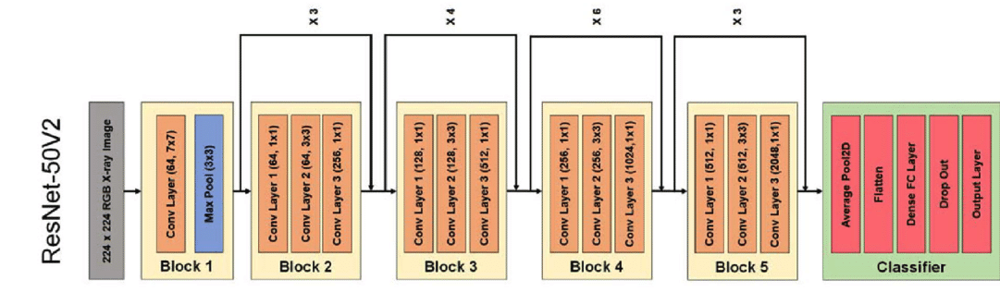

In [ ]:
# Building a ResNet50V2 model loaded with pre-trained ImageNet weights
model = keras.applications.ResNet50V2(weights="imagenet", include_top=False)
# Setting up a model that returns the activation values for our target layer
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.inputs, outputs=layer.output)


**Activation Maximization :** Activation maximization is a technique used in feature visualization of convolutional neural networks (CNNs). It involves finding the input image that maximizes the activation of a particular neuron or filter in the network. This can be used to understand what features the neuron or filter is detecting in the input image. This can be done by using optimization techniques like gradient ascent.

## Set up the gradient ascent process
we use gradient ascent to maximize the activation of the neuron or filter. This involves finding the input image that results in the highest activation of the neuron or filter. The idea is that the input image that maximizes the activation of the neuron or filter is likely to highlight the features that the neuron or filter is designed to detect. By visualizing these features, we can gain insights into the workings of the CNN and how it is processing the input image.

The "loss" we will maximize is simply the mean of the activation of a specific filter in
our target layer.

Our gradient ascent function simply computes the gradients of the loss given below
with regard to the input image, and update the update image so as to move it
towards a state that will activate the target filter more strongly. So the algorithm proceeds as follows:
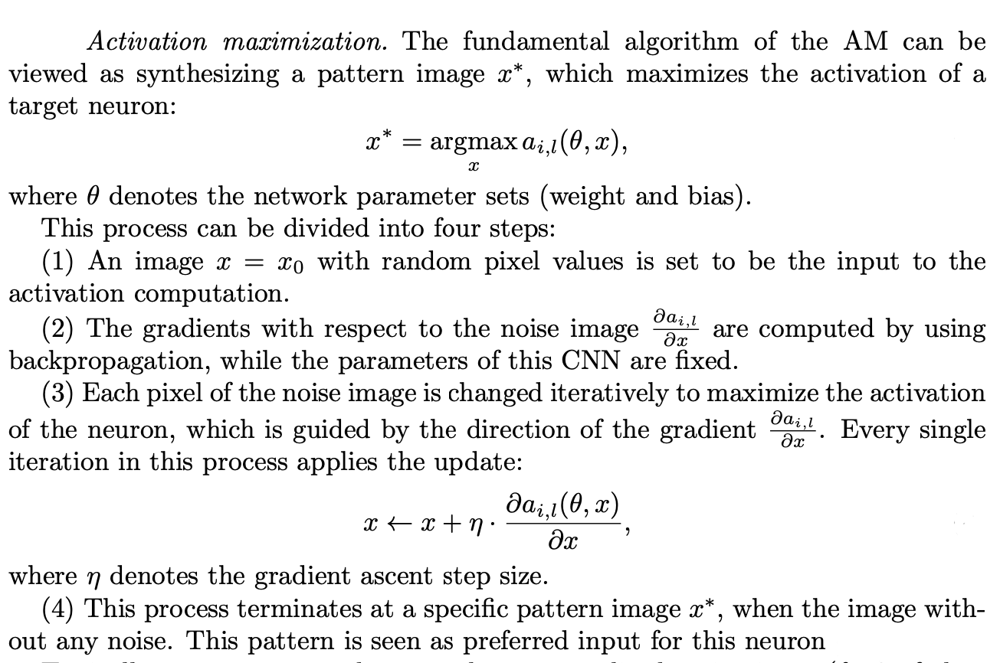

**source** Paper: HOW CONVOLUTIONAL NEURAL NETWORKS SEE THE WORLD — A SURVEY OF CONVOLUTIONAL NEURAL NETWORK VISUALIZATION METHODS

In [ ]:
def compute_loss(input_image, filter_index):
    print("in")
    activation = feature_extractor(input_image)
    print(f"Activation: {activation}")
    filter_activation = activation[:, :, :, filter_index]
    print(f"Filter activation: {filter_activation}")
    return tf.reduce_mean(filter_activation)


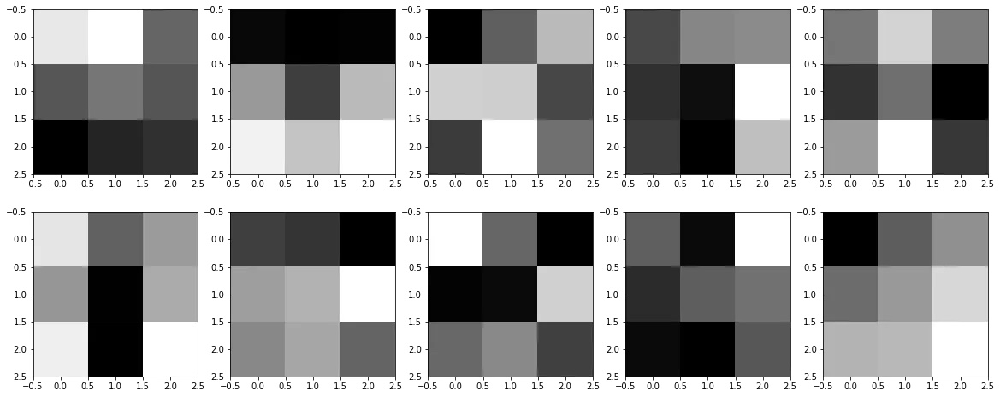

A CNN approximates filters that extract unique features from images. These unique features will be used to get a prediction.The above set of figures are the different kernels or filters the CNN learns after the training process. Each filter is designed to capture a certain feature of an image.

**source**:https://medium.com/analytics-vidhya/visualization-of-convolution-layers-in-a-cnn-and-its-importance-44d00ad4eb70

In [ ]:
@tf.function
def gradient_ascent_step(img, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(img)
        loss = compute_loss(img, filter_index)
    # Compute gradients.
    grads = tape.gradient(loss, img)
    # Normalize gradients.
    grads = tf.math.l2_normalize(grads)
    img += learning_rate * grads
    return loss, img


## Set up the end-to-end filter visualization loop

Our process is as follow:

- Start from an input image.
- Repeatedly apply the gradient ascent step function defined above
- Convert the resulting input image back to a displayable form, by normalizing it,
center-cropping it, and restricting it to the [0, 255] range.

In [ ]:
def initialize_image(path_to_image):
    # Load the image from file
    img = Image.open(path_to_image)
    # Resize the image to (224, 224)
    img = img.resize((img_height, img_width))
    # Convert the image to a numpy array and preprocess it
    img = np.array(img) / 255.0
    img = (img - 0.5) * 0.25
    # Add an extra dimension to represent a batch of size 1
    img = np.expand_dims(img, axis=0)
    return img


In [ ]:
def visualize_filter(filter_index):
    # We run gradient ascent for 30 steps
    iterations = 30
    learning_rate = 10

    img = initialize_image('/content/AlbertEinstein.jpeg')

    # processing

    for iteration in range(iterations):
        loss, img = gradient_ascent_step(img, filter_index, learning_rate)
    # Decoding the resulting input image
    img = deprocess_image(img[0].numpy())
    return print(loss), img

In [ ]:
def deprocess_image(img):
    # Normalize array: center on 0., ensure variance is 0.15
    img -= img.mean()
    img /= img.std() + 1e-5
    img *= 0.15

    # Center crop
    img = img[25:-25, 25:-25, :]

    # Clip to [0, 1]
    img += 0.5
    img = np.clip(img, 0, 1)

    # Convert to RGB array
    img *= 255
    img = np.clip(img, 0, 255).astype("uint8")
    return img

## Visualize the first 64 filters in the target layer

Now, let's make a 8x8 grid of the first 64 filters
in the target layer to get of feel for the range
of different visual patterns that the model has learned.

`all_imgs` = Initialize an empty list `all_imgs` to store all the processed images.

Iterate through all the filters (64 filters in this case) in the model.

loss, img =  Call the `visualize_filter` function to get the loss and processed image for the current filter index.

`all_imgs.append(img)`: Append the processed image to the `all_imgs` list.





In [ ]:
# Compute image inputs that maximize per-filter activations
# for the first 64 filters of our target layer
all_imgs = []
for filter_index in range(64):
    print("Processing filter %d" % (filter_index,))
    loss, img = visualize_filter(filter_index)
    all_imgs.append(img)
# Build a black picture with enough space for
# our 8 x 8 filters of size 128 x 128, with a 5px margin in between
margin = 5
n = 8
cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3)) #Initialize a black image with the calculated width and height and 3 color channels.
# Fill the picture with our saved filters
for i in range(n):
    for j in range(n):              #Iterate through all the rows and columns of filters.
        img = all_imgs[i * n + j]   #Get the processed image for the current row and column.
        stitched_filters[
            (cropped_width + margin) * i : (cropped_width + margin) * i + cropped_width,
            (cropped_height + margin) * j : (cropped_height + margin) * j
            + cropped_height,
            :,
        ] = img                    #Fill the final stitched image with the current processed image.
keras.preprocessing.image.save_img("stiched_filters.png", stitched_filters)



The initial convolutional layers in a CNN typically capture low-level features such as edges, corners, lines, blobs etc that are common in many images.These features are not specific to any particular object or category, but they are building blocks for higher-level features that are learned by the later layers. The initial filters in a CNN are randomly initialized and then learn to detect the most common patterns in the training data through the process of gradient ascent during training. Since the initial layer filters are not specialized to detect specific objects, the activation patterns they produce are not particularly informative or interpretable in terms of object recognition. Instead, the most interesting activation patterns are usually found in the later layers of a CNN, where the filters are specialized to detect more complex features and objects.

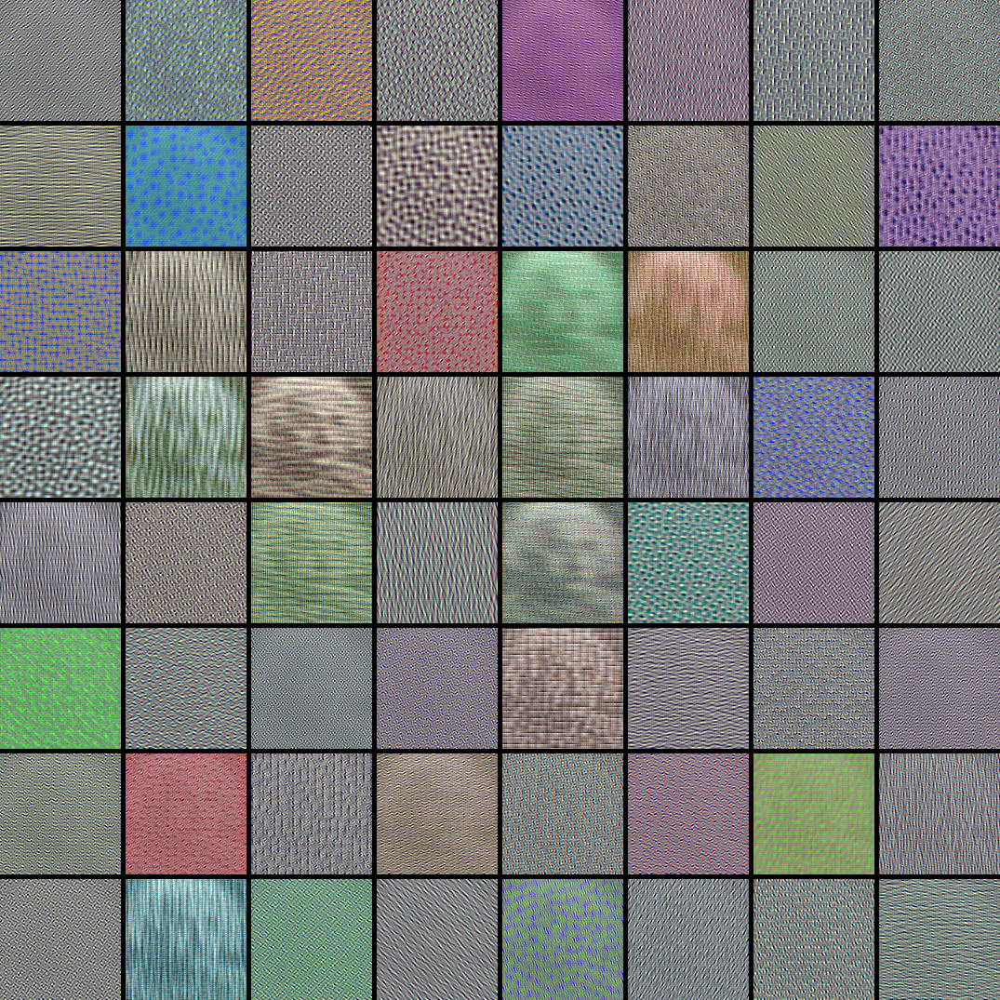

In [ ]:
display(Image.open("stiched_filters.png"))

In [ ]:
# Compute image inputs that maximize per-filter activations
# for the first 64 filters of our target layer
all_imgs = []
for filter_index in range(64):
    print("Processing filter %d" % (filter_index,))
    loss, img = visualize_filter(filter_index)
    all_imgs.append(img)
# Build a black picture with enough space for
# our 8 x 8 filters of size 128 x 128, with a 5px margin in between
margin = 5
n = 8
cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3)) #Initialize a black image with the calculated width and height and 3 color channels.
# Fill the picture with our saved filters
for i in range(n):
    for j in range(n):              #Iterate through all the rows and columns of filters.
        img = all_imgs[i * n + j]   #Get the processed image for the current row and column.
        stitched_filters[
            (cropped_width + margin) * i : (cropped_width + margin) * i + cropped_width,
            (cropped_height + margin) * j : (cropped_height + margin) * j
            + cropped_height,
            :,
        ] = img                    #Fill the final stitched image with the current processed image.
keras.preprocessing.image.save_img("stiched_filters_1.png", stitched_filters)



When visualizing the filters of a deep neural network, it is common to observe that some filters capture specific parts or features of an image, while others seem more abstract and difficult to interpret. This can happen because the deeper layers of a neural network learn increasingly complex and abstract representations of the input data, which may not correspond to easily recognizable visual features.

For example, in the case of an image of Albert Einstein, some filters in the feature extractor model might capture details like the shape of his face or the texture of his hair, while other filters might represent more abstract features like the lighting conditions or the overall composition of the image. These abstract features may not have a clear correspondence with specific visual elements in the image, but they can still be important for the model to make accurate predictions about the image's content or category.

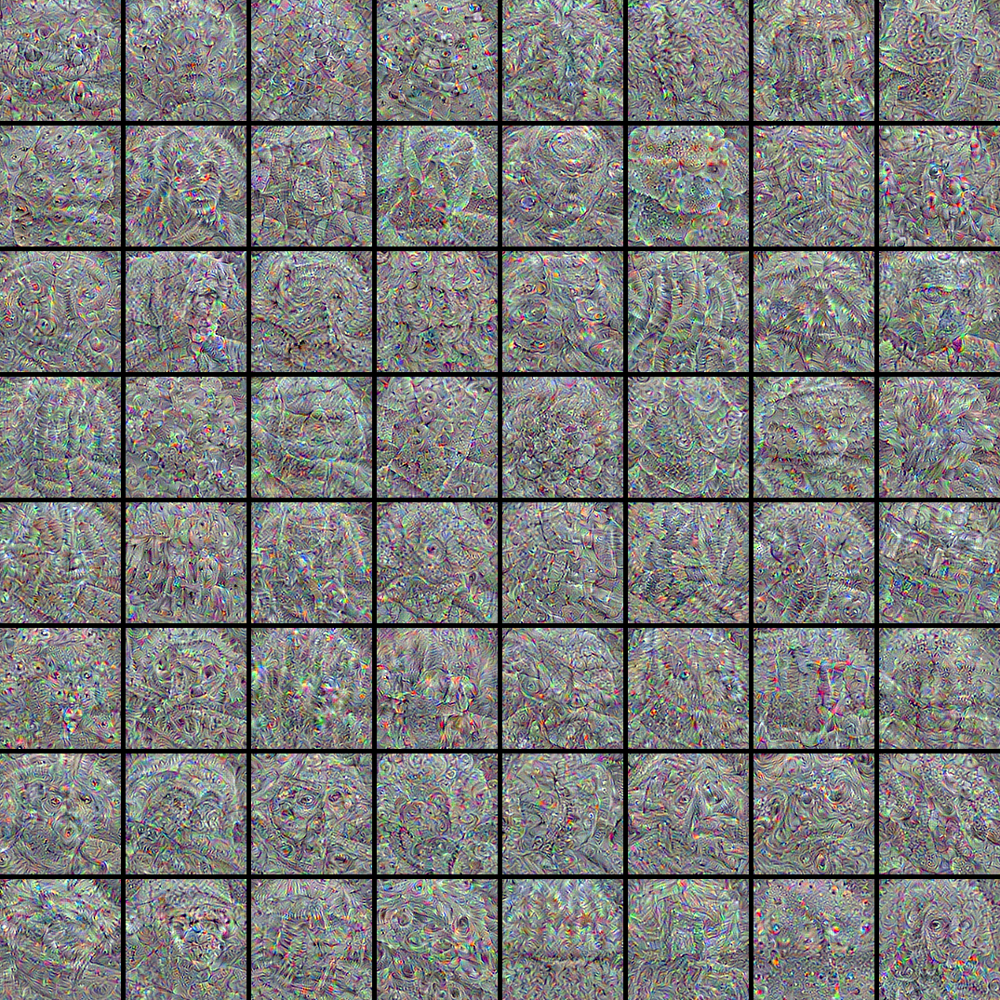

In [ ]:
display(Image.open("stiched_filters_1.png"))

In [ ]:
# Compute image inputs that maximize per-filter activations
# for the first 64 filters of our target layer
all_imgs = []
for filter_index in range(64):
    print("Processing filter %d" % (filter_index,))
    loss, img = visualize_filter(filter_index)
    all_imgs.append(img)
# Build a black picture with enough space for
# our 8 x 8 filters of size 128 x 128, with a 5px margin in between
margin = 5
n = 8
cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3)) #Initialize a black image with the calculated width and height and 3 color channels.
# Fill the picture with our saved filters
for i in range(n):
    for j in range(n):              #Iterate through all the rows and columns of filters.
        img = all_imgs[i * n + j]   #Get the processed image for the current row and column.
        stitched_filters[
            (cropped_width + margin) * i : (cropped_width + margin) * i + cropped_width,
            (cropped_height + margin) * j : (cropped_height + margin) * j
            + cropped_height,
            :,
        ] = img                    #Fill the final stitched image with the current processed image.
keras.preprocessing.image.save_img("stiched_filters_2.png", stitched_filters)


The AM method has a
considerable shortcoming: as the CNN becoming deeper, the visualized patterns
in higher layers are usually tend to be unrealistic and uninterpretable. In order
to find the human-interpretable patterns, many regularization methods have been
experimentally shown to improve the interpretability of the patterns which will be discussed in second half of the presentation.
As we move deeper into the network, the filters start to capture more abstract and high-level features, such as object parts,that are specific to the images in the training data. These higher-level features are often more complex and difficult to interpret in isolation, but they can be combined to form a representation of the input image that is suitable for the final classification layer. Here filters focuses precisely on more sophasticated featuresIn the final convolutional layer, the filters are usually designed to capture complex and abstract features that are important for the task of classification, such as object parts that are relevant to the particular classes. These features can be difficult to interpret because they may not have a simple visual explanation or they may be influenced by many other layers in the network. The complexity and variation of the visualized patterns are increasing from lower layers to higher layers, which indicates that increasingly invariant features are learned by the filters.

As many of these filters are not interpretable at all as what features they are extracting from an image in order to maximise their activation with Activation Maximization method to improve that we have used DGN-AM method further.

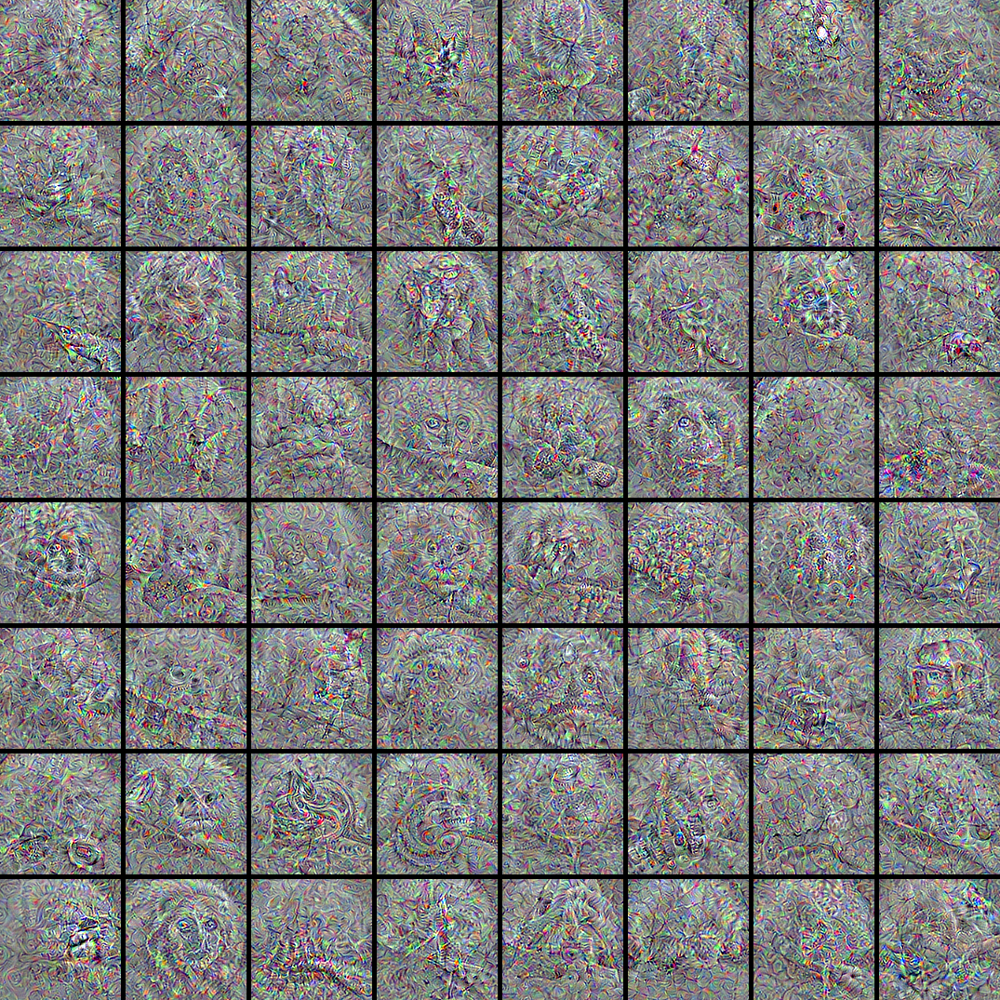

In [ ]:
display(Image.open("stiched_filters_2.png"))

#DGN-AM -  Deep Generator Network to perform Activation Maximization



## Shortcomings of the Activation Maximization method
Visualized patterns in deeper layers are often humanly hard to interprete.
This could be solved by introducing some form of "natural image prior" into the objective function, so that the output images resemble natural images.

One possible form of these priors are regularization methods like
l2 decay, Gaussian blur, clipping pixels with small norm or clipping pixels with small contribution (Krizhevsky, Sutskever, & Hinton, 2015, https://arxiv.org/abs/1506.06579).



Although on them own these priors can improve the interpretability of images, the best results can be achieved when combining them:
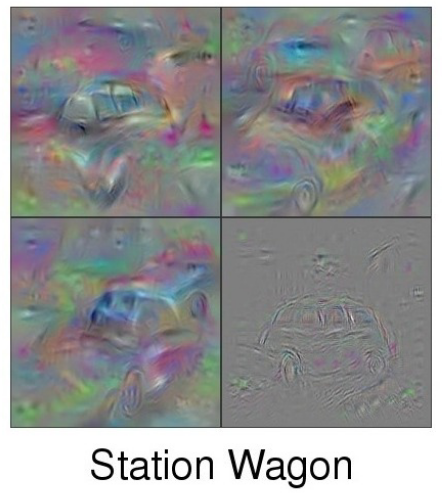

These are four different combinations of hyperparameters of the aforementioned regularization techniques (Krizhevsky, Sutskever, & Hinton, 2015, https://arxiv.org/abs/1506.06579).

Although you can start to see the outlines of a station wagon from these images, these are nevertheless very different from natural images.





##The DGN-AM paper
One especially interesting approach was chosen by the author of the paper "Synthesizing the preferred inputs for neurons in neural networks via deep generator networks" (https://github.com/Evolving-AI-Lab/synthesizing).
Here, instead of designing image priors, the authors propose to use a learned natural image prior akin to a generative model of images.  

They suggest to use a deep generator network (DGN) similar to a GAN with the objective of producing images similar to a given dataset of natural images (Huang, Liu, & Weinberger, 2016, https://arxiv.org/abs/1602.02644).

When producing an image to activate some part of a network, the image can only be "drawn" from the trained generator network. This ensures the human interpretability of the generated image.

Structure of the network:

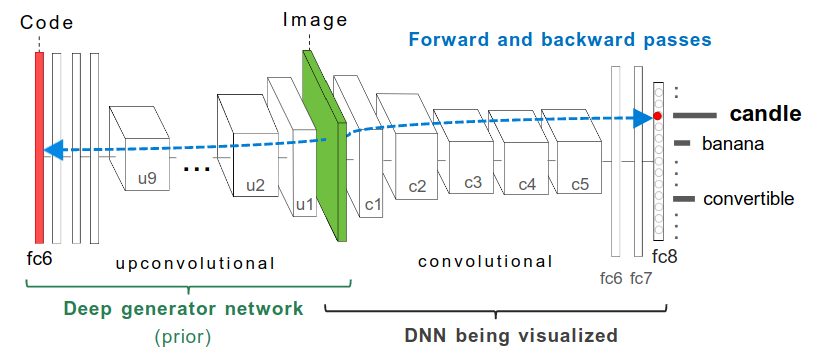

**The "GAN-like" training process**

The training process involves four convolutional networks:
1. a fixed encoder network $E$ to be inverted
2. a generator network $G$
3. a fixed “comparator” network $C$ and
4. a discriminator $D$.

$G$ is trained to invert a feature representation extracted by the network $E$, and has to satisfy three objectives:
  1. for a feature vector $y_i = E(x_i)$, the synthesized image $G(y_i)$ has to be close to the original image $x_i$
  2. the features of the output image $C(G(y_i))$ have to be close to those of the real image $C(x_i)$
  3. $D$ should be unable to distinguish $G(y_i)$ from real images. The objective for $D$ is to discriminate between synthetic images $G(y_i)$ and real images $x_i$ as in the original GAN.

In the aforementioned paper, the encoder $E$ is CaffeNet truncated at different layers. The authors denote CaffeNet truncated at layer $l$ by $E_l$, and the network trained to invert $E_l$ by $G_l$. The “comparator” $C$ is CaffeNet up to
layer `pool5`. $D$ is a convolutional network with 5 convolutional and 2 fully connected layers. $G$ is an upconvolutional (aka deconvolutional) architecture with 9 upconvolutional and 3 fully connected layers.
Full details in the paper from Huang, Liu, & Weinberger https://arxiv.org/abs/1602.02644).

**Training Objective**

Intuitively, we search in the input code space of the image generator model $G$ to find a code $y$ such that $G(y)$ is an image that produces high
activation of the target neuron $h$ in the DNN $\phi$ that we want to visualize (i.e. optimization maximizes $\phi h(G(y)))$.

Concretely the objective function describes finding a code $\widehat{y^l}$ s.t.:

$$\widehat{y^l} = \underset{y^l}{argmax}(\phi_h(G_l(y^l))-\lambda\Vert y^l\Vert)$$

The authors state that using $L_2$-Regularization with $\lambda=0.005$ works best.


##Setup

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/MyDrive
!mkdir advanced_ml
%cd advanced_ml
!git clone https://github.com/BVLC/caffe.git
%cd caffe

!cp Makefile.config.example Makefile.config

Cloning into 'caffe'...
remote: Enumerating objects: 65274, done.
remote: Total 65274 (delta 0), reused 0 (delta 0), pack-reused 65274
Receiving objects: 100% (65274/65274), 74.14 MiB | 15.31 MiB/s, done.
Resolving deltas: 100% (41242/41242), done.
Updating files: 100% (701/701), done.
/content/drive/MyDrive/advanced_ml/caffe


In [ ]:
!sudo apt-get install libsnappy-dev
!sudo apt-get install libleveldb-dev
!sudo apt-get install libgflags2.2
!sudo apt-get install libgflags-dev
!sudo apt-get install libgoogle-glog-dev
!sudo apt-get install libprotobuf-dev protobuf-compiler
!sudo apt-get install libhdf5–10
!sudo apt-get install libhdf5-serial-dev
!sudo apt-get install libhdf5-dev
!sudo apt-get install libhdf5-cpp-11
!sudo apt-get install libopencv-dev
!sudo apt-get install liblmdb-dev
!sudo apt-get install libopencv-dev python-opencv
!sudo apt-get install libboost-all-dev
!sudo apt-get install libpython3.8-dev
!sudo apt-get install libboost-python-dev
!sudo apt-get install python-dev
!sudo apt-get install libleveldb-dev


In [ ]:
#Useful link: https://filip-drapejkowski.medium.com/caffe-in-google-colab-2021-2d730989c849

#Open Makefile.config and uncomment WITH_PYTHON_LAYER := 1
#Also change the Python version to 3.8
#Comment the two lines:
  #-gencode arch=compute_20,code=sm_20 \
	#-gencode arch=compute_20,code=sm_21 \

# Add these directories to INCLUDE_DIRS in line 97:
  #/usr/include/opencv4 /usr/include/python3.8 /usr/include/hdf5/serial

#All occurences of CV_LOAD_IMAGE_COLOR need to be replaced with:
  #cv::IMREAD_COLOR
#ALL occurences of CV_LOAD_IMAGE_GRAYSCALE need to be replaced with:
  #cv::IMREAD_GRAYSCALE

#Uncomment OPENCV_VERSION := 3


In [ ]:
#If problems with hdf5 occur you can symlink the correct files and
#include them in path and included directories
!find /usr -iname "*hdf5.so"
!find /usr -iname "*hdf5_hl.so"
!ln -s /usr/lib/x86_64-linux-gnu/libhdf5_serial.so /usr/lib/x86_64-linux-gnu/libhdf5.so
!ln -s /usr/lib/x86_64-linux-gnu/libhdf5_serial_hl.so /usr/lib/x86_64-linux-gnu/libhdf5_hl.so

%env CPATH="/usr/include/hdf5/serial/"

!sed -i 's/\/usr\/local\/include/\/usr\/local\/include \/usr\/include\/hdf5\/serial\//'  Makefile.config

/usr/lib/x86_64-linux-gnu/hdf5/serial/libhdf5.so
/usr/lib/x86_64-linux-gnu/hdf5/serial/libhdf5_hl.so
env: CPATH="/usr/include/hdf5/serial/"


In [ ]:
!sudo ln -s /usr/lib/x86_64-linux-gnu/libpython3.8.so /usr/lib/x86_64-linux-gnu/libpython3.8m.so
!sudo ln -s /usr/lib/x86_64-linux-gnu/libboost_python38.so /usr/lib/x86_64-linux-gnu/libboost_python3.so


In [ ]:
#Then compile caffe
%cd /content/drive/MyDrive/advanced_ml/caffe/
#!make clean
!make all
!make pycaffe

/content/drive/MyDrive/advanced_ml/caffe
make: Nothing to be done for 'pycaffe'.


In [ ]:
%cd /content/drive/MyDrive/advanced_ml/caffe/python

/content/drive/MyDrive/advanced_ml/caffe/python


In [ ]:
!for req in $(cat requirements.txt); do pip install $req; done

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 62.6 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.5/236.5 KB 17.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Creat

In [ ]:
!sudo apt install imagemagick

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-510
Use 'sudo apt autoremove' to remove it.
The following additional packages will be installed:
  fonts-droid-fallback fonts-noto-mono fonts-urw-base35 ghostscript gsfonts
  imagemagick-6-common imagemagick-6.q16 libdjvulibre-text libdjvulibre21
  libgs9 libgs9-common libidn11 libijs-0.35 libjbig2dec0 liblqr-1-0
  libmagickcore-6.q16-6 libmagickcore-6.q16-6-extra libmagickwand-6.q16-6
  libnetpbm10 libwmf0.2-7 netpbm poppler-data
Suggested packages:
  fonts-noto fonts-freefont-otf | fonts-freefont-ttf fonts-texgyre
  ghostscript-x imagemagick-doc autotrace cups-bsd | lpr | lprng enscript gimp
  gnuplot grads hp2xx html2ps libwmf-bin mplayer povray radiance sane-utils
  texlive-base-bin transfig ufraw-batch inkscape libjxr-tools libwmf0.2-7-gtk
  poppler-utils fonts-japanese-mincho | fonts-ipafont

In [ ]:
%cd /content/drive/MyDrive/advanced_ml
!git clone https://github.com/Evolving-AI-Lab/synthesizing.git

/content/drive/MyDrive/advanced_ml
Cloning into 'synthesizing'...
remote: Enumerating objects: 875, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 875 (delta 0), reused 0 (delta 0), pack-reused 870
Receiving objects: 100% (875/875), 1.79 MiB | 9.63 MiB/s, done.
Resolving deltas: 100% (532/532), done.


In [ ]:
%cd /content/drive/MyDrive/advanced_ml/synthesizing

/content/drive/MyDrive/advanced_ml/synthesizing


In [ ]:
!chmod 755 -R /content/drive/MyDrive/advanced_ml/synthesizing

In [ ]:
%cd nets/upconv
!./download.sh

/content/drive/MyDrive/advanced_ml/synthesizing/nets/upconv
--2023-02-17 13:47:46--  https://lmb.informatik.uni-freiburg.de/resources/binaries/arxiv2016_alexnet_inversion_with_gans/release_deepsim_v0.zip
Resolving lmb.informatik.uni-freiburg.de (lmb.informatik.uni-freiburg.de)... 132.230.167.23
Connecting to lmb.informatik.uni-freiburg.de (lmb.informatik.uni-freiburg.de)|132.230.167.23|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1252578508 (1.2G) [application/zip]
Saving to: ‘release_deepsim_v0.zip’

release_deepsim_v0. 100%[===================>]   1.17G  1.99MB/s    in 6m 50s  

2023-02-17 13:54:37 (2.91 MB/s) - ‘release_deepsim_v0.zip’ saved [1252578508/1252578508]

Extracting...
Archive:  release_deepsim_v0.zip
   creating: release_deepsim_v0/
  inflating: release_deepsim_v0/demo.py  
  inflating: release_deepsim_v0/patchShow.py  
  inflating: release_deepsim_v0/Cat.jpg  
  inflating: release_deepsim_v0/README  
   creating: release_deepsim_v0/fc6/
  in

In [ ]:
%cd nets/caffenet
!./download.sh

/content/drive/MyDrive/advanced_ml/synthesizing/nets/caffenet
Downloading...
--2023-02-21 13:10:25--  http://dl.caffe.berkeleyvision.org/bvlc_reference_caffenet.caffemodel
Resolving dl.caffe.berkeleyvision.org (dl.caffe.berkeleyvision.org)... 128.32.162.150
Connecting to dl.caffe.berkeleyvision.org (dl.caffe.berkeleyvision.org)|128.32.162.150|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 243862418 (233M) [application/octet-stream]
Saving to: ‘bvlc_reference_caffenet.caffemodel’

bvlc_reference_caff   0%[                    ] 171.47K  70.3KB/s    in 2m 6s   

2023-02-21 13:18:04 (1.36 KB/s) - Connection closed at byte 175584. Retrying.

--2023-02-21 13:18:05--  (try: 2)  http://dl.caffe.berkeleyvision.org/bvlc_reference_caffenet.caffemodel
Connecting to dl.caffe.berkeleyvision.org (dl.caffe.berkeleyvision.org)|128.32.162.150|:80... connected.
HTTP request sent, awaiting response... 206 Partial Content
Length: 243862418 (233M), 243686834 (232M) remaining [appli

In [ ]:
%cd nets/googlenet
!./download.sh

/content/drive/MyDrive/advanced_ml/synthesizing/nets/googlenet
Downloading...
--2023-02-21 13:31:10--  http://dl.caffe.berkeleyvision.org/bvlc_googlenet.caffemodel
Resolving dl.caffe.berkeleyvision.org (dl.caffe.berkeleyvision.org)... 128.32.162.150
Connecting to dl.caffe.berkeleyvision.org (dl.caffe.berkeleyvision.org)|128.32.162.150|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 53533754 (51M) [application/octet-stream]
Saving to: ‘bvlc_googlenet.caffemodel’

bvlc_googlenet.caff  34%[=====>              ]  17.68M  94.7KB/s    in 8m 20s  

2023-02-21 13:39:32 (36.2 KB/s) - Connection closed at byte 18542817. Retrying.

--2023-02-21 13:39:33--  (try: 2)  http://dl.caffe.berkeleyvision.org/bvlc_googlenet.caffemodel
Connecting to dl.caffe.berkeleyvision.org (dl.caffe.berkeleyvision.org)|128.32.162.150|:80... connected.
HTTP request sent, awaiting response... 206 Partial Content
Length: 53533754 (51M), 34990937 (33M) remaining [application/octet-stream]
Saving to

##Experiments

In the following we will look at 4 experiments, which each investigates another aspect of the quality of the generated images.

1. Optimizing codes to activate **output neurons of the CaffeNet DNN** trained on the ImageNet dataset. This examines the overall functionality of the script.

In [ ]:
%cd /content/drive/MyDrive/advanced_ml/synthesizing
!./1_activate_output.sh

/content/drive/MyDrive/advanced_ml/synthesizing
-------------
 unit: 643
 n_iters: 200
 start learning rate: 8.0
 end learning rate: 1e-10
 seed: 0
 opt_layer: fc6
 act_layer: fc8
-------------
 debug: 0
 output dir: output
 net weights: nets/caffenet/bvlc_reference_caffenet.caffemodel
 net definition: nets/caffenet/caffenet.prototxt
-------------
E0222 22:04:21.010008 14687 common.cpp:114] Cannot create Cublas handle. Cublas won't be available.
E0222 22:04:21.019693 14687 common.cpp:121] Cannot create Curand generator. Curand won't be available.
Starting optimizing
['input', 'conv1', 'relu1', 'pool1', 'norm1', 'conv2', 'relu2', 'pool2', 'norm2', 'conv3', 'relu3', 'conv4', 'relu4', 'conv5', 'relu5', 'pool5', 'fc6', 'relu6', 'fc7', 'relu7', 'fc8', 'prob']
max: 286 6.41, obj: 643 1.09
['input', 'conv1', 'relu1', 'pool1', 'norm1', 'conv2', 'relu2', 'pool2', 'norm2', 'conv3', 'relu3', 'conv4', 'relu4', 'conv5', 'relu5', 'pool5', 'fc6', 'relu6', 'fc7', 'relu7', 'fc8', 'prob']
max: 461 6.94,

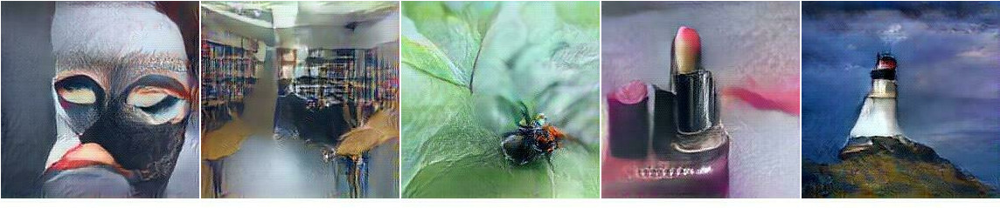

In [ ]:
display(Image.open("output/example1.jpg"))

  **Differences between visualizations of the AM and the DGN-AM**

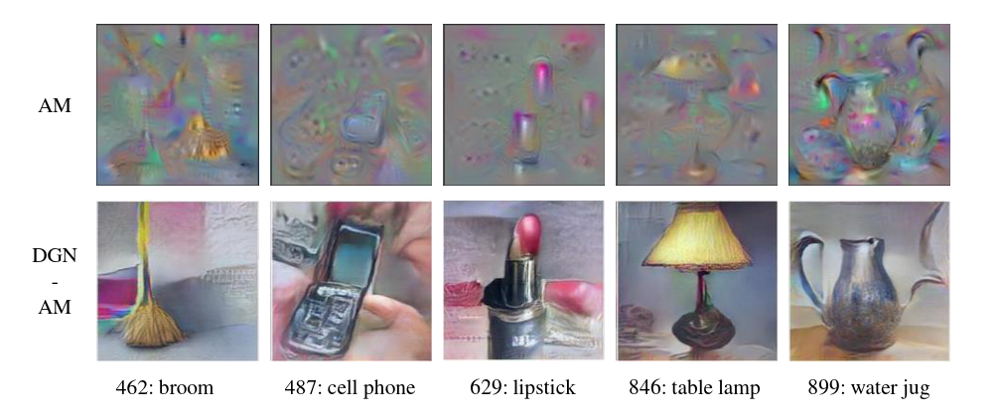

2. Optimizing codes to activate **output neurons of a different network, here AlexNet DNN** trained on MIT Places205 dataset. This examines the generalizability of the learned prior:

In [ ]:
%cd /content/drive/MyDrive/advanced_ml/synthesizing
!./2_activate_output_placesCNN.sh

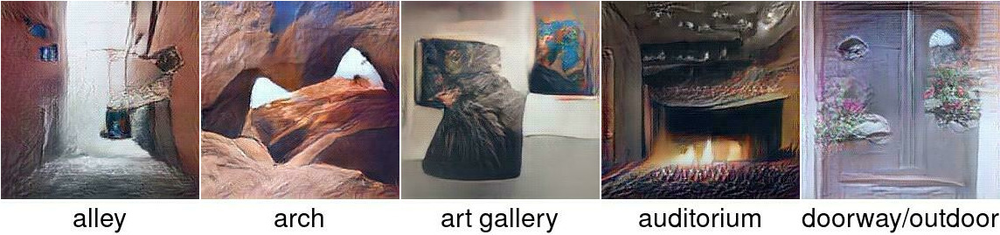

In [ ]:
display(Image.open("output/example2.jpg"))

The same prior used here produces the best images for AlexNet architecture trained on different datasets. It also works on other architectures but the image quality might degrade (see below).

3. Optimizing codes to activate **hidden neurons at layer 5 of the DeepScene DNN** trained on MIT Places dataset. This checks the difference of visualizations for output vs. hidden neurons.

In [ ]:
%cd /content/drive/MyDrive/advanced_ml/synthesizing
!./3_activate_hidden.sh

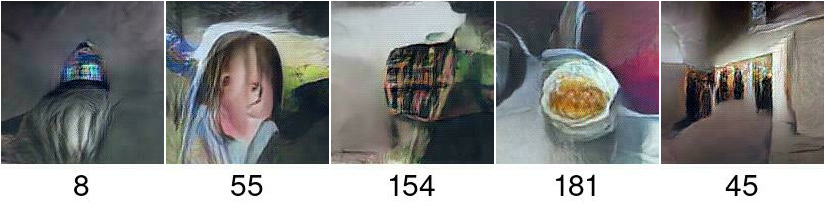

In [ ]:
display(Image.open("output/example3.jpg"))

From left to right are units that are semantically labeled by humans in as: lighthouse, building, bookcase, food, and painting (https://arxiv.org/pdf/1605.09304.pdf). Althouogh humans can still detect features of natural images, the interpretability of the images generated for the hidden neurons is much worse than for the output neurons.

4. Optimizing code to activate the **output neurons of a different architecture, GoogLeNet**, trained on ImageNet. Note that the learning rate used in this example is different from that in the example 1 and 2 above.

In [ ]:
%cd /content/drive/MyDrive/advanced_ml/synthesizing
!./4_activate_output_GoogLeNet.sh

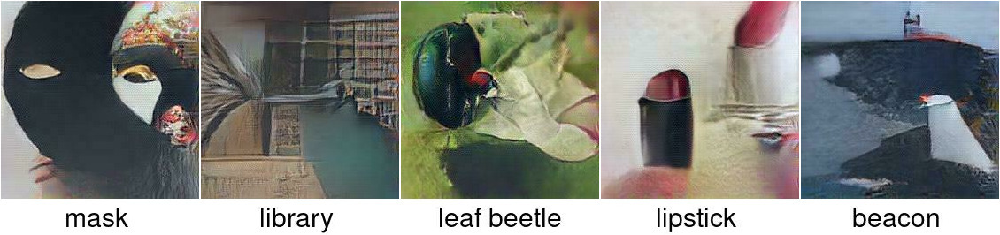

In [ ]:
display(Image.open("output/example4.jpg"))

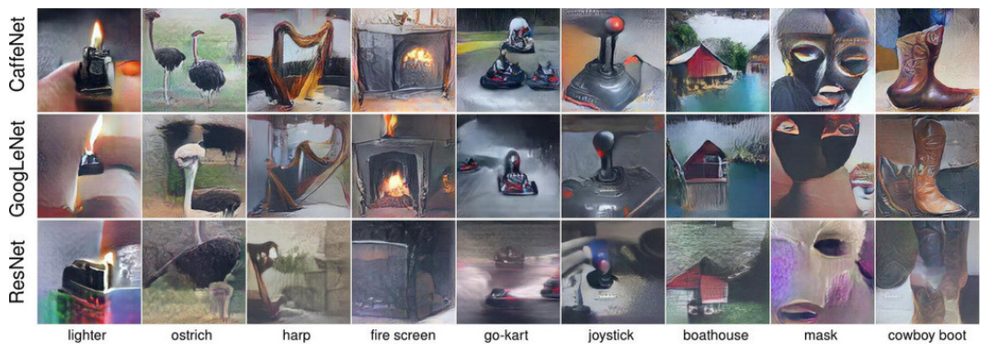

Comparison of the generated images, using CaffeNet as the Encoder for different DNNs. It is clearly visible, that the Encoder E works best on DNNs which are similar in structure to E.

##Discussion
**Do the synthesized images teach us what the neurons prefer or what the prior prefers?**

To answer this the authors train 3 different DNNs following the CaffeNet architecture to discriminate 2000 classes. The first 1000 classes contain regular ImageNet images, and the 2nd 1000 classes contain modified ImageNet images. They perform 3 types of modifications:
1. cutting up each image into quarters and re-stitching them back in a random order
2. converting regular RGB into BRG images
3. bluring out images with Gaussian blur with radius of 3

**Visualization of 1.**


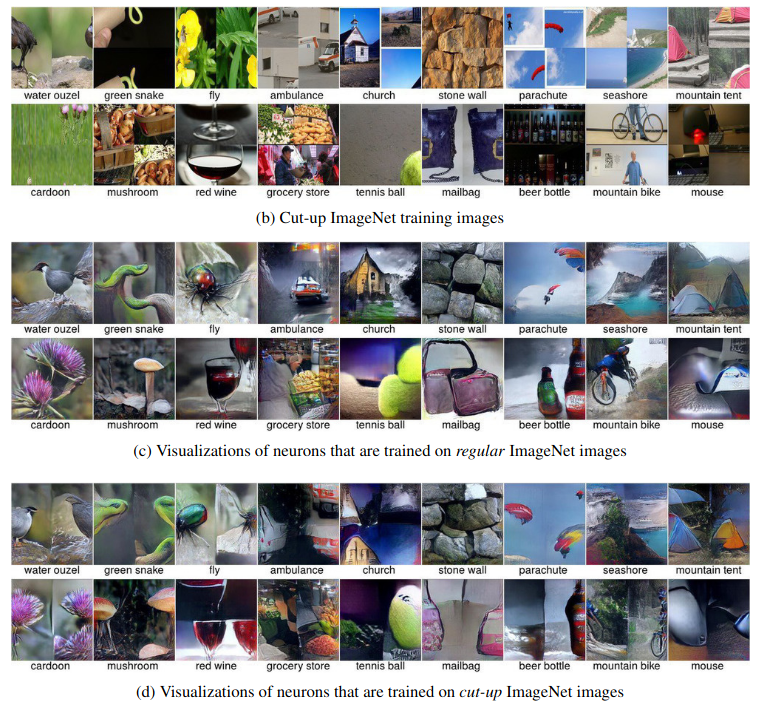

**Visualization of 2.**


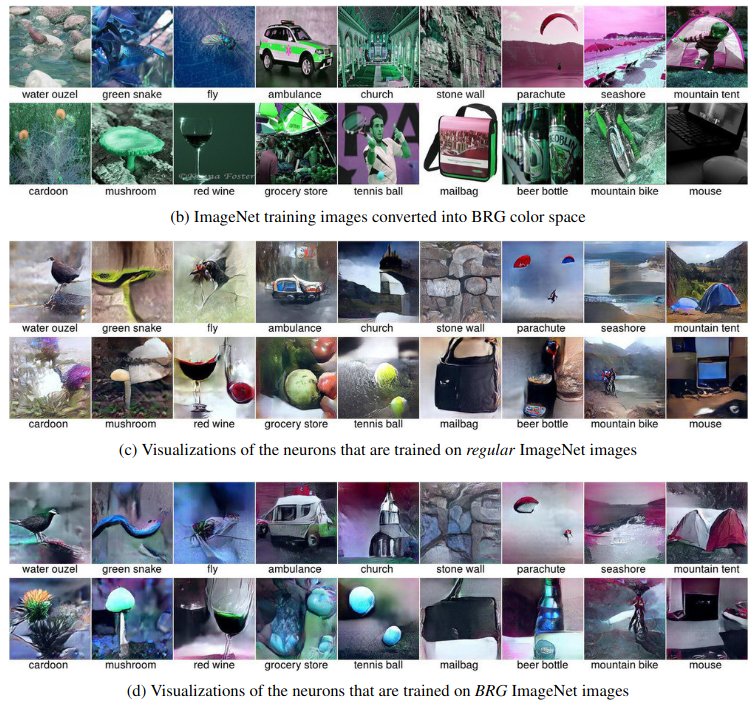

**Visualization of 3.**





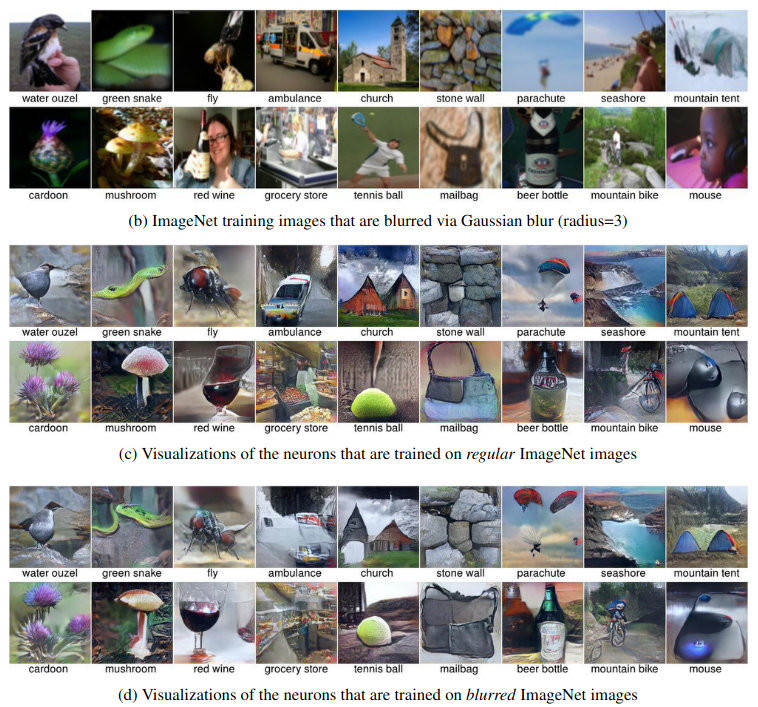

The findings demonstrate that the DGN-AM visualizations accurately represent the characteristics acquired by neurons through the data and that these traits are not solely generated by the learned prior.
Another aspect, that is worth mentioning is that the authors note that they found no correlation between the activation of a neuron and the recognizability of its visualization.

##Conclusion##

While both Activation Maximization and DGN-AM aim to generate visualizations that allow us to interpret the behavior of deep neural networks, there are some key differences between the two methods.

Activation Maximization is a technique that involves maximizing the activation of specific neurons in a neural network in order to generate visualizations of the features that the network is learning. These visualizations are generated by selecting a target neuron and then optimizing an input that maximizes the activation of that neuron. However, one drawback of this method is that it can generate images which are very hard to interprete for humans.

This is where the DGN-AM approach has clear benefits. It is a variant of Activation Maximization that uses a combination of both the network's prior and the data it has been trained on to generate visualizations. This allows DGN-AM to generate visualizations that more closely reflect the features learned by the network from the data and therefore are more natural and humanly interpretable.

The most important drawback is that the Encoder network has to be similar to the DNN that is to be visualized, otherwise we don't get images, that are easy to interpret.
